In [6]:
# (1) Import 및 데이터 불러오기 + 저장
import pandas as pd
import holidays

# CSV 불러오기
train_path = './data/train/train.csv'
df = pd.read_csv(train_path)

# 컬럼명 영어로 변경
df.columns = ['date', 'store_menu', 'sales_qty']

# 업장명 / 메뉴명 분리
df[['store', 'menu']] = df['store_menu'].str.split('_', n=1, expand=True)

# 날짜 처리
df['date'] = pd.to_datetime(df['date'])

# 한국 공휴일 데이터 생성
kr_holidays = holidays.KR(years=range(df['date'].dt.year.min(),
                                      df['date'].dt.year.max() + 1))
holiday_dates = set(pd.to_datetime(list(kr_holidays.keys())).date)

# 공휴일 여부
df['is_holiday'] = df['date'].dt.date.isin(holiday_dates)


In [7]:
# (2) 각 업장별 메뉴 개수 출력
menu_count_per_store = df.groupby('store')['menu'].nunique().reset_index()
menu_count_per_store.columns = ['store', 'menu_count']

print(menu_count_per_store)

# 메뉴 종류가 많은 상위 10개 업장
print("\n상위 10개 업장별 메뉴 개수")
print(menu_count_per_store.sort_values('menu_count', ascending=False).head(10))


        store  menu_count
0  느티나무 셀프BBQ          23
1          담하          42
2        라그로타          25
3        미라시아          31
4         연회장          23
5       카페테리아          24
6       포레스트릿          12
7       화담숲주막           8
8       화담숲카페           5

상위 10개 업장별 메뉴 개수
        store  menu_count
1          담하          42
3        미라시아          31
2        라그로타          25
5       카페테리아          24
0  느티나무 셀프BBQ          23
4         연회장          23
6       포레스트릿          12
7       화담숲주막           8
8       화담숲카페           5


In [9]:
# (3) 전체 메뉴 기준 연속 휴일 판매 평균 비교

# ===== 연속 공휴일 그룹 식별 =====
holidays_df = pd.DataFrame(sorted(holiday_dates), columns=['date'])
holidays_df['date'] = pd.to_datetime(holidays_df['date'])
holidays_df = holidays_df.sort_values('date')

holidays_df['gap'] = holidays_df['date'].diff().dt.days.fillna(0)
holidays_df['group'] = (holidays_df['gap'] > 1).cumsum()

holiday_groups = holidays_df.groupby('group')['date'].agg(list).reset_index()
holiday_groups['length'] = holiday_groups['date'].apply(len)

holiday_map = {}
for _, row in holiday_groups.iterrows():
    dates = row['date']
    length = row['length']
    for i, d in enumerate(dates):
        if length >= 2:
            if i == length - 1:  # 마지막 날
                holiday_map[d.date()] = 'last_day'
            else:
                holiday_map[d.date()] = 'before_last_day'

# holiday_group 컬럼 추가
df['holiday_group'] = 'normal'
df.loc[df['date'].dt.date.isin(holiday_map.keys()), 'holiday_group'] = \
    df['date'].dt.date.map(holiday_map)

# ===== weekend 여부 추가 =====
df['is_weekend'] = df['date'].dt.weekday >= 5  # 5=토요일, 6=일요일

# ===== 평균 계산 =====
avg_all_days = df['sales_qty'].mean()
avg_before_last = df[df['holiday_group'] == 'before_last_day']['sales_qty'].mean()
avg_all_holidays = df[df['holiday_group'] != 'normal']['sales_qty'].mean()
avg_weekend = df[df['is_weekend']]['sales_qty'].mean()

# ===== 결과 DataFrame =====
holiday_comparison = pd.DataFrame({
    'metric': [
        'avg_all_days',
        'avg_before_last_day_in_2+day_holidays',
        'avg_all_days_in_2+day_holidays',
        'avg_weekend'
    ],
    'avg_sales_qty': [
        avg_all_days,
        avg_before_last,
        avg_all_holidays,
        avg_weekend
    ]
})

print(holiday_comparison)


                                  metric  avg_sales_qty
0                           avg_all_days      10.653083
1  avg_before_last_day_in_2+day_holidays      22.861658
2         avg_all_days_in_2+day_holidays      20.138169
3                            avg_weekend      13.996728


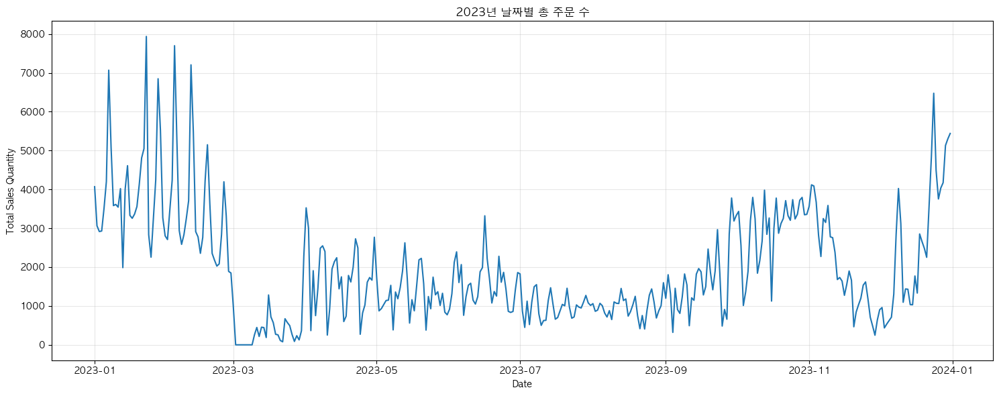

In [11]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd

# ===== 한글 폰트 설정 =====
mpl.rc('font', family='AppleGothic')
mpl.rcParams['axes.unicode_minus'] = False

# ===== 2023년 데이터 필터링 =====
df_2023 = df[(df['date'] >= '2023-01-01') & (df['date'] <= '2023-12-31')]

# ===== 날짜별 총 주문 수(판매량 합계) =====
daily_sales_2023 = df_2023.groupby('date')['sales_qty'].sum().reset_index()

# ===== 그래프 그리기 =====
plt.figure(figsize=(15, 6))
plt.plot(daily_sales_2023['date'], daily_sales_2023['sales_qty'])
plt.title('2023년 날짜별 총 주문 수')
plt.xlabel('Date')
plt.ylabel('Total Sales Quantity')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


In [12]:
# (X) 모든 메뉴 출력 코드블럭

# 중복 제거한 모든 메뉴 추출
all_menus = df['store_menu'].unique()

# 전체 메뉴 출력
for menu in all_menus:
    print(menu)

# 전체 메뉴 개수 출력
print(f"\n총 메뉴 개수: {len(all_menus)}")


느티나무 셀프BBQ_1인 수저세트
느티나무 셀프BBQ_BBQ55(단체)
느티나무 셀프BBQ_대여료 30,000원
느티나무 셀프BBQ_대여료 60,000원
느티나무 셀프BBQ_대여료 90,000원
느티나무 셀프BBQ_본삼겹 (단품,실내)
느티나무 셀프BBQ_스프라이트 (단체)
느티나무 셀프BBQ_신라면
느티나무 셀프BBQ_쌈야채세트
느티나무 셀프BBQ_쌈장
느티나무 셀프BBQ_육개장 사발면
느티나무 셀프BBQ_일회용 소주컵
느티나무 셀프BBQ_일회용 종이컵
느티나무 셀프BBQ_잔디그늘집 대여료 (12인석)
느티나무 셀프BBQ_잔디그늘집 대여료 (6인석)
느티나무 셀프BBQ_잔디그늘집 의자 추가
느티나무 셀프BBQ_참이슬 (단체)
느티나무 셀프BBQ_친환경 접시 14cm
느티나무 셀프BBQ_친환경 접시 23cm
느티나무 셀프BBQ_카스 병(단체)
느티나무 셀프BBQ_콜라 (단체)
느티나무 셀프BBQ_햇반
느티나무 셀프BBQ_허브솔트
담하_(단체) 공깃밥
담하_(단체) 생목살 김치전골 2.0
담하_(단체) 은이버섯 갈비탕
담하_(단체) 한우 우거지 국밥
담하_(단체) 황태해장국 3/27까지
담하_(정식) 된장찌개
담하_(정식) 물냉면 
담하_(정식) 비빔냉면
담하_(후식) 된장찌개
담하_(후식) 물냉면
담하_(후식) 비빔냉면
담하_갑오징어 비빔밥
담하_갱시기
담하_공깃밥
담하_꼬막 비빔밥
담하_느린마을 막걸리
담하_담하 한우 불고기
담하_담하 한우 불고기 정식
담하_더덕 한우 지짐
담하_들깨 양지탕
담하_라면사리
담하_룸 이용료
담하_메밀면 사리
담하_명인안동소주
담하_명태회 비빔냉면
담하_문막 복분자 칵테일
담하_봉평메밀 물냉면
담하_생목살 김치찌개
담하_스프라이트
담하_은이버섯 갈비탕
담하_제로콜라
담하_참이슬
담하_처음처럼
담하_카스
담하_콜라
담하_테라
담하_하동 매실 칵테일
담하_한우 떡갈비 정식
담하_한우 미역국 정식
담하_한우 우거지 국밥
담하_한우 차돌박이 된장찌개
담하_황태해장국
라그로타_AUS (200g)
라그로타_G-Charge(3)
라그로타_G

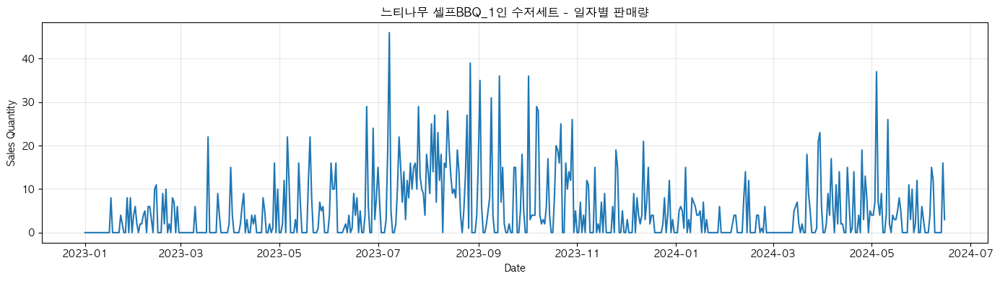

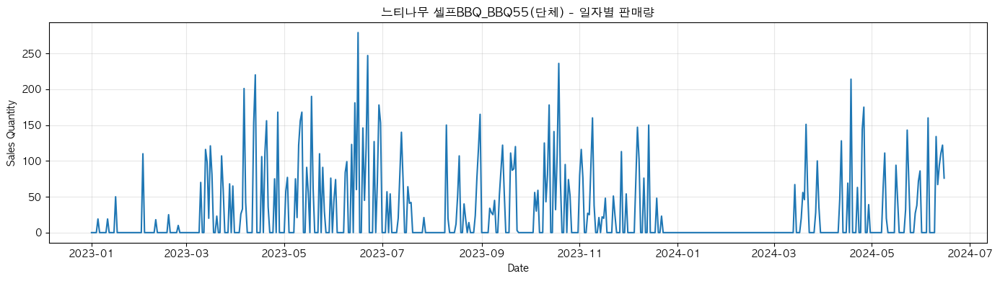

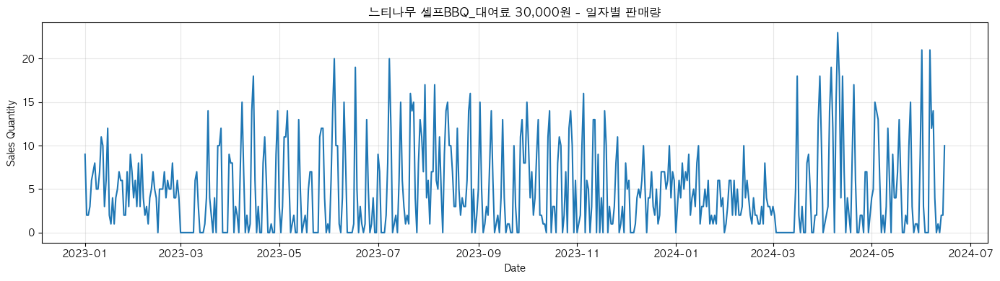

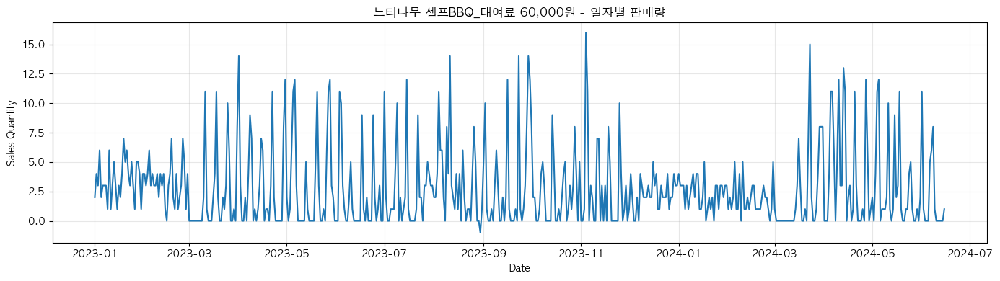

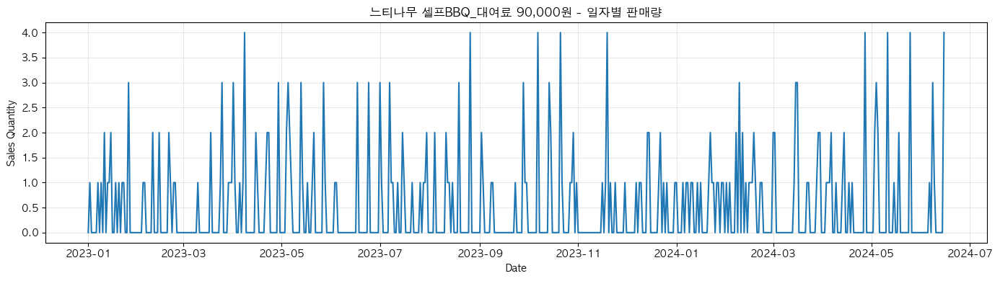

...

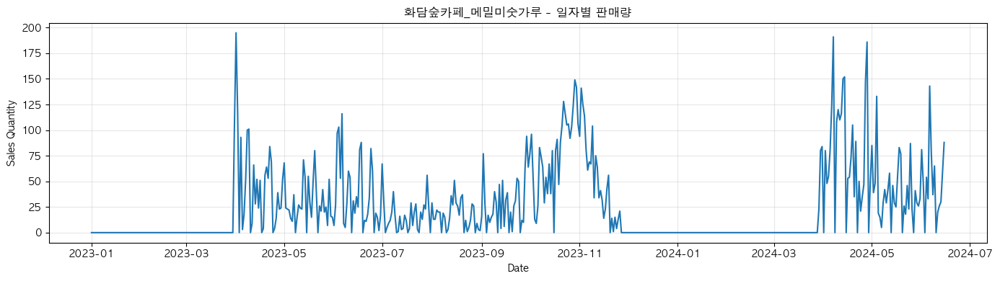

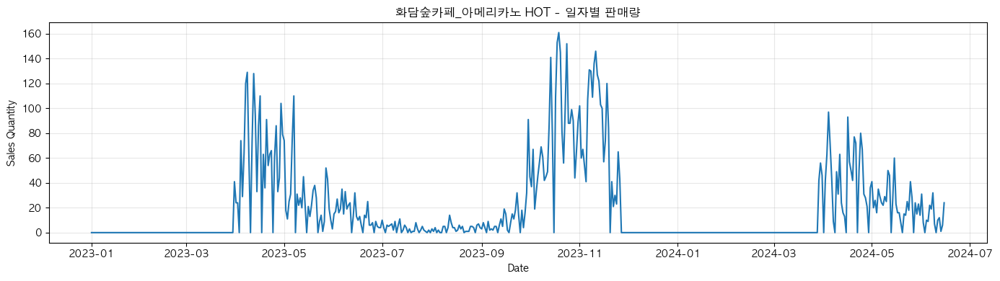

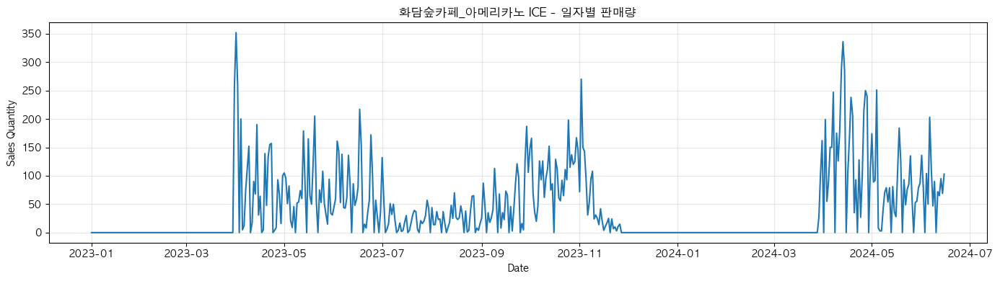

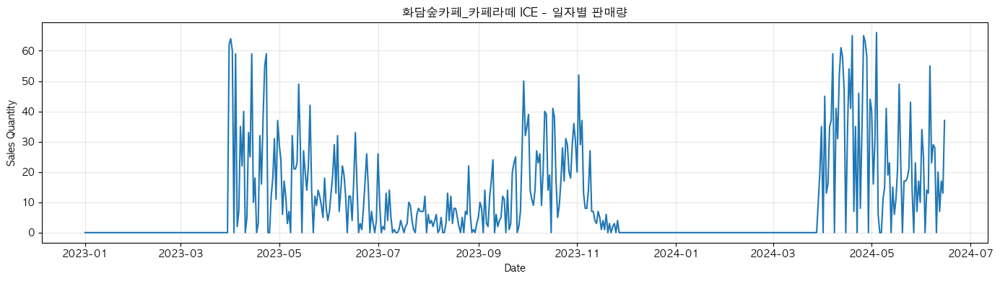

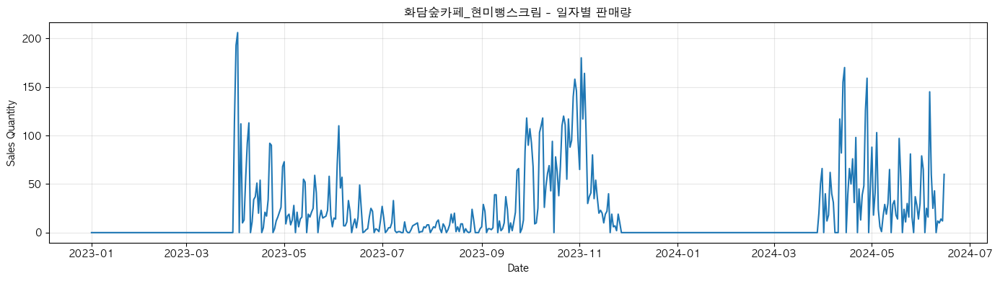

In [13]:
import matplotlib.pyplot as plt
import matplotlib as mpl

# ===== 한글 폰트 설정 (Mac용) =====
mpl.rc('font', family='AppleGothic')
mpl.rcParams['axes.unicode_minus'] = False

# ===== 모든 메뉴 리스트 =====
all_menus = df['store_menu'].unique()

# ===== 메뉴별 그래프 출력 =====
for menu in all_menus:
    menu_df = df[df['store_menu'] == menu].groupby('date')['sales_qty'].sum().reset_index()
    
    plt.figure(figsize=(14, 4))
    plt.plot(menu_df['date'], menu_df['sales_qty'])
    plt.title(f'{menu} - 일자별 판매량')
    plt.xlabel('Date')
    plt.ylabel('Sales Quantity')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
